# Loading and Inspecting NYPD Arrests Data

### Purpose:
This code loads the NYPD Arrests dataset from Google Drive into a pandas DataFrame and displays its first few rows to understand its structure and content.

---

### Steps:

1. **Mount Google Drive**:
   - Used `drive.mount` to access files stored in Google Drive.

2. **Load Dataset**:
   - Defined the file path: `/content/drive/My Drive/Colab Notebooks/NYPD_Arrests_Data__Historic_.csv`.
   - Loaded the CSV file into a pandas DataFrame (`data`) using `pd.read_csv()`.

3. **Inspect Data**:
   - Displayed the first few rows of the dataset using `data.head()` to preview the columns and sample records.

---

### Output:
- The first five rows of the dataset, showcasing:
  - Column names.
  - Sample records for inspection.
  - Data types and general structure.

---

### Outcome:
The dataset is successfully loaded and ready for further exploration, cleaning, and analysis.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd

file_path = '/content/drive/My Drive/Colab Notebooks/NYPD_Arrests_Data__Historic_.csv'
data = pd.read_csv(file_path)

# Display the first few rows
print(data.head())

Mounted at /content/drive
   ARREST_KEY ARREST_DATE  PD_CD                         PD_DESC  KY_CD  \
0   186134240  08/07/2018  184.0                             NaN    NaN   
1   220476154  11/13/2020  397.0  ROBBERY,OPEN AREA UNCLASSIFIED  105.0   
2   199148493  07/01/2019  440.0                             NaN    NaN   
3   209928408  02/22/2020  569.0           MARIJUANA, SALE 4 & 5  235.0   
4   220330574  11/10/2020  101.0                       ASSAULT 3  344.0   

                      OFNS_DESC    LAW_CODE LAW_CAT_CD ARREST_BORO  \
0                           NaN  PL 12070E1          F           K   
1                       ROBBERY  PL 1600500          F           B   
2                           NaN  PL 1553502          F           M   
3               DANGEROUS DRUGS  PL 2214000          M           M   
4  ASSAULT 3 & RELATED OFFENSES  PL 1200001          M           B   

   ARREST_PRECINCT  JURISDICTION_CODE AGE_GROUP PERP_SEX       PERP_RACE  \
0               73        

# Converting `ARREST_DATE` to Datetime Format

### Purpose:
This code converts the `ARREST_DATE` column in the dataset to a datetime format for easier date-related operations and analysis.

---

### Steps:

1. **Convert to Datetime**:
   - Used `pd.to_datetime()` to transform the `ARREST_DATE` column into a pandas `datetime64` format.

2. **Verify Conversion**:
   - Checked the data type of the `ARREST_DATE` column after conversion using `dtype` to ensure it is `datetime64`.

---

### Output:
- Displays the data type of the `ARREST_DATE` column as `datetime64[ns]`, confirming the successful conversion.

---

### Outcome:
The `ARREST_DATE` column is now in datetime format, enabling operations like extracting year, month, day, and performing time-series analysis.


In [ ]:
# Convert 'ARREST_DATE' to datetime format
data['ARREST_DATE'] = pd.to_datetime(data['ARREST_DATE'])

# Verify the conversion
print(data['ARREST_DATE'].dtype)


datetime64[ns]


# Imputing Missing Values in the Dataset

### Purpose:
This code handles missing values in specific columns of the dataset using median and mode imputation, ensuring data completeness for further analysis.

---

### Steps:

1. **Impute with Median**:
   - For numerical columns `PD_CD` and `KY_CD`:
     - Calculated the median value using `median()`.
     - Replaced missing values with the median using `fillna()`.

2. **Impute with Mode**:
   - For the categorical column `LAW_CAT_CD`:
     - Identified the mode (most frequent value) using `mode()[0]`.
     - Replaced missing values with the mode using `fillna()`.

3. **Verify Imputation**:
   - Checked the dataset for any remaining missing values using `isnull().sum()`.

---

### Output:
- Prints a summary of missing values for each column:
  - Columns with successfully imputed missing values will now show `0` missing entries.
  - Confirms that the dataset is free of missing values.

---

### Outcome:
The dataset is now complete, with no missing values in critical columns, ready for subsequent analysis or model training.


In [ ]:
# Impute missing values for 'PD_CD' and 'KY_CD' with the median
for column in ['PD_CD', 'KY_CD']:
    median_value = data[column].median()
    data[column].fillna(median_value, inplace=True)

# Impute missing values for 'LAW_CAT_CD' with the mode (most frequent category)
mode_value = data['LAW_CAT_CD'].mode()[0]
data['LAW_CAT_CD'].fillna(mode_value, inplace=True)

# Check if there are any more missing values
print(data.isnull().sum())


<ipython-input-2-346de7cd6cc8>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[column].fillna(median_value, inplace=True)
<ipython-input-2-346de7cd6cc8>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using '

ARREST_KEY              0
ARREST_DATE             0
PD_CD                   0
PD_DESC              9169
KY_CD                   0
OFNS_DESC            9169
LAW_CODE              196
LAW_CAT_CD              0
ARREST_BORO             8
ARREST_PRECINCT         0
JURISDICTION_CODE      10
AGE_GROUP              17
PERP_SEX                0
PERP_RACE               0
X_COORD_CD              1
Y_COORD_CD              1
Latitude                1
Longitude               1
Lon_Lat                 1
dtype: int64


# Extracting Temporal Features from `ARREST_DATE`

### Purpose:
This code extracts year, month, day, and weekday from the `ARREST_DATE` column to create additional features for time-based analysis.

---

### Steps:

1. **Extract Temporal Features**:
   - **`YEAR`**: Extracted the year from `ARREST_DATE` using `.dt.year`.
   - **`MONTH`**: Extracted the month using `.dt.month`.
   - **`DAY`**: Extracted the day of the month using `.dt.day`.
   - **`WEEKDAY`**: Extracted the day of the week using `.dt.weekday` (Monday=0, Sunday=6).

2. **Verify Results**:
   - Displayed the first few rows of the newly created columns (`YEAR`, `MONTH`, `DAY`, `WEEKDAY`) to confirm the transformation.

---

### Output:
- Displays the first 5 rows of the new columns:
  - **YEAR**: Year of the arrest.
  - **MONTH**: Month of the arrest.
  - **DAY**: Day of the arrest.
  - **WEEKDAY**: Numerical representation of the weekday.

---

### Outcome:
The dataset now includes additional temporal features (`YEAR`, `MONTH`, `DAY`, `WEEKDAY`), enabling deeper insights and time-based analysis.


In [ ]:
# Extract year, month, and day from 'ARREST_DATE'
data['YEAR'] = data['ARREST_DATE'].dt.year
data['MONTH'] = data['ARREST_DATE'].dt.month
data['DAY'] = data['ARREST_DATE'].dt.day
data['WEEKDAY'] = data['ARREST_DATE'].dt.weekday  # Monday=0, Sunday=6

# Verify the new columns
print(data[['YEAR', 'MONTH', 'DAY', 'WEEKDAY']].head())


   YEAR  MONTH  DAY  WEEKDAY
0  2018      8    7        1
1  2020     11   13        4
2  2019      7    1        0
3  2020      2   22        5
4  2020     11   10        1


# Visualizing Distributions of Numerical and Categorical Features

### Purpose:
This code generates histograms for numerical features and count plots for categorical features in the dataset to understand their distributions.

---

### Steps:

#### Numerical Features:
1. **Define Numerical Columns**:
   - Selected numerical columns: `PD_CD`, `KY_CD`, `ARREST_PRECINCT`, `X_COORD_CD`, `Y_COORD_CD`, `Latitude`, `Longitude`.

2. **Generate Histograms**:
   - For each numerical feature:
     - Created a histogram using `sns.histplot()`.
     - Set the number of bins to 30 for a detailed view.
     - Added titles, x-axis, and y-axis labels.

#### Categorical Features:
1. **Define Categorical Columns**:
   - Selected categorical columns: `LAW_CAT_CD`, `ARREST_BORO`, `AGE_GROUP`, `PERP_SEX`, `PERP_RACE`.

2. **Generate Count Plots**:
   - For each categorical feature:
     - Created a count plot using `sns.countplot()`.
     - Rotated x-axis labels for better readability.

---

### Outputs:
1. **Histograms**:
   - Visualize the frequency distributions of numerical features.
   - Provide insights into data range and common values.

2. **Count Plots**:
   - Display the distribution of categorical features.
   - Highlight dominant categories for each feature.

---

### Outcome:
The visualizations offer a comprehensive view of the dataset's numerical and categorical features, aiding in understanding trends, patterns, and potential outliers.


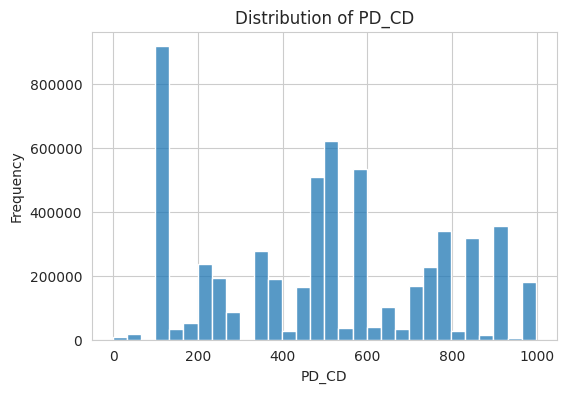

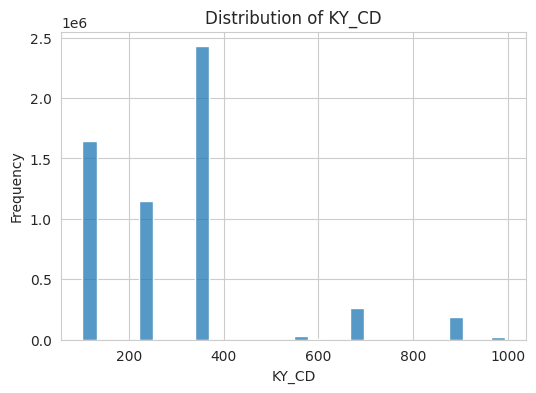

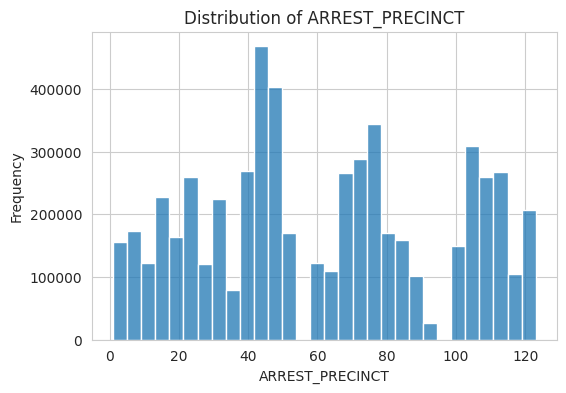

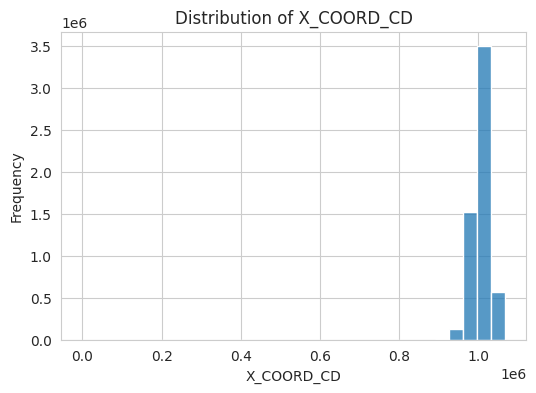

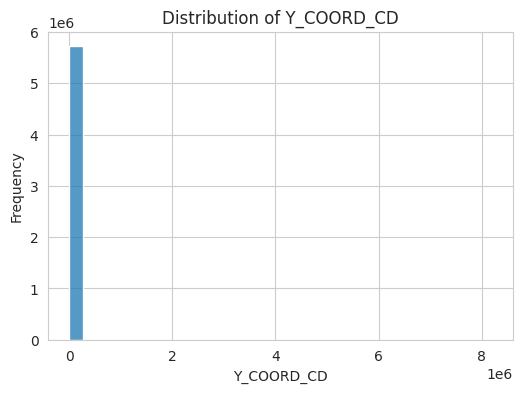

...

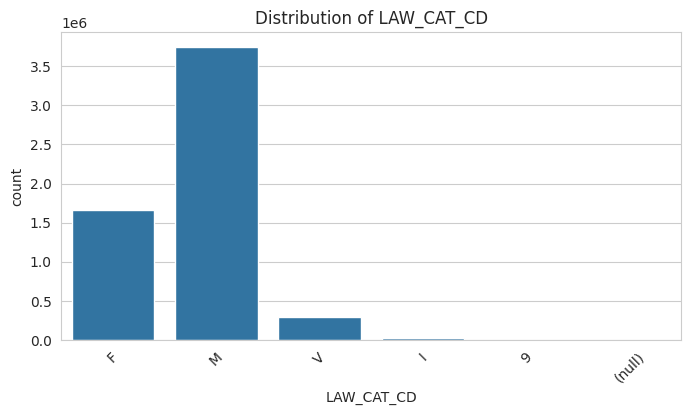

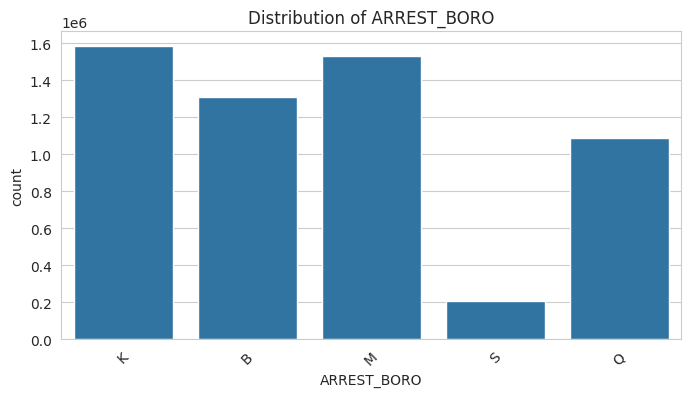

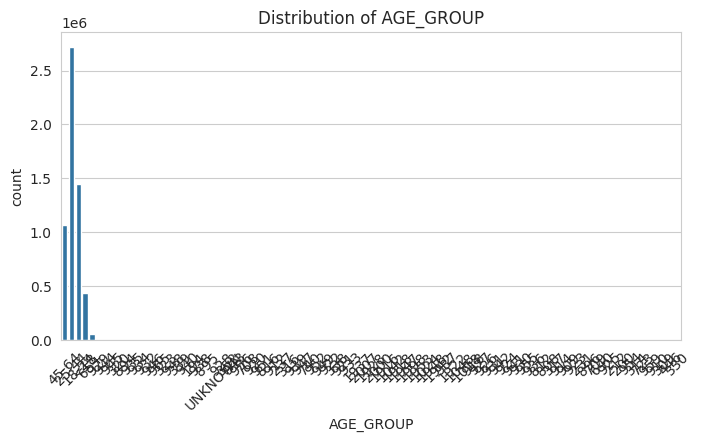

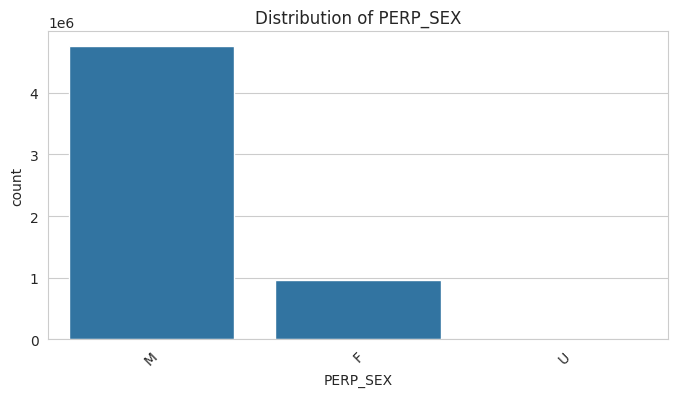

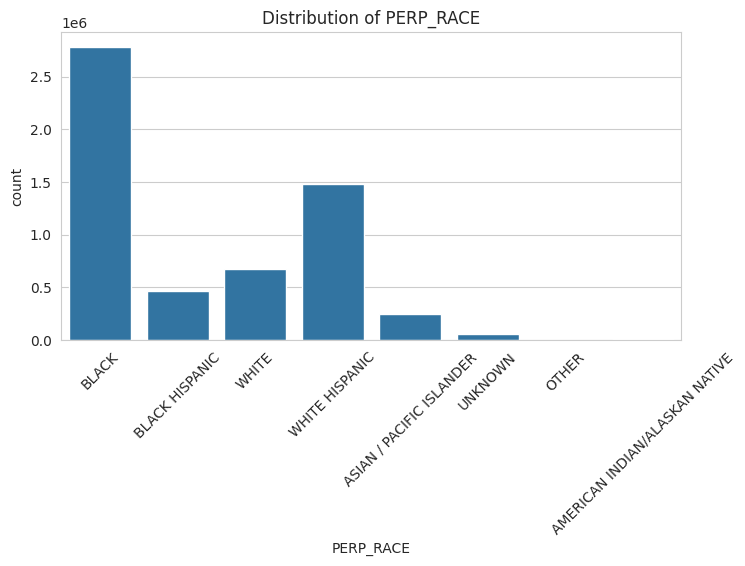

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Histograms for numerical features
numerical_features = ['PD_CD', 'KY_CD', 'ARREST_PRECINCT', 'X_COORD_CD', 'Y_COORD_CD', 'Latitude', 'Longitude']
for feature in numerical_features:
    plt.figure(figsize=(6, 4))
    sns.histplot(data[feature], kde=False, bins=30)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

# Count plots for categorical features
categorical_features = ['LAW_CAT_CD', 'ARREST_BORO', 'AGE_GROUP', 'PERP_SEX', 'PERP_RACE']
for feature in categorical_features:
    plt.figure(figsize=(8, 4))
    sns.countplot(x=feature, data=data)
    plt.title(f'Distribution of {feature}')
    plt.xticks(rotation=45)
    plt.show()


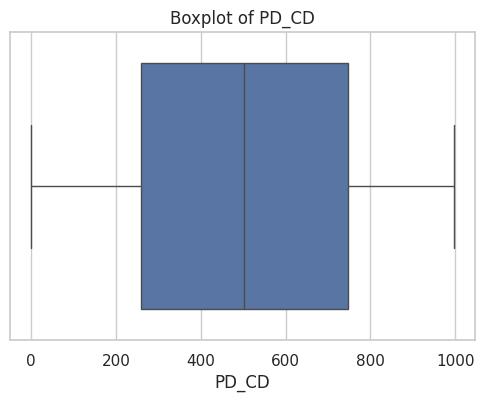

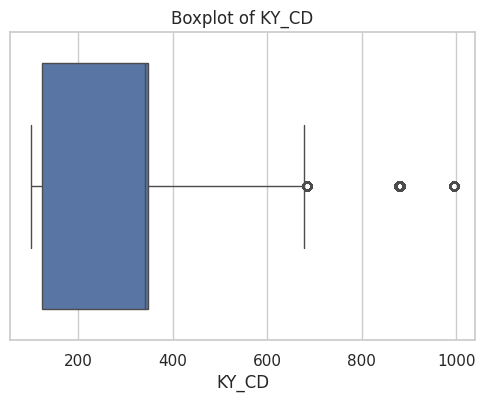

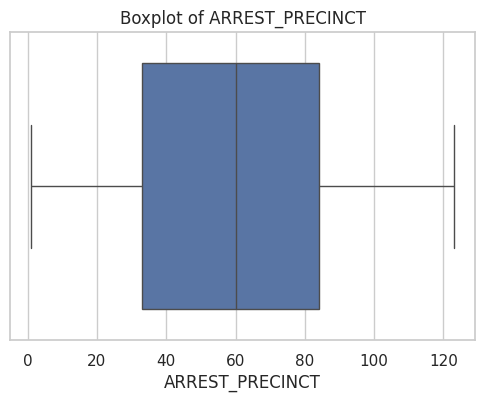

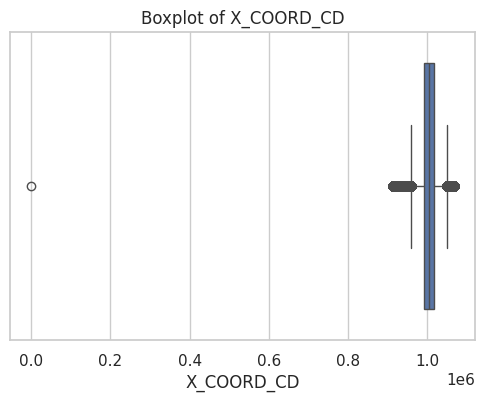

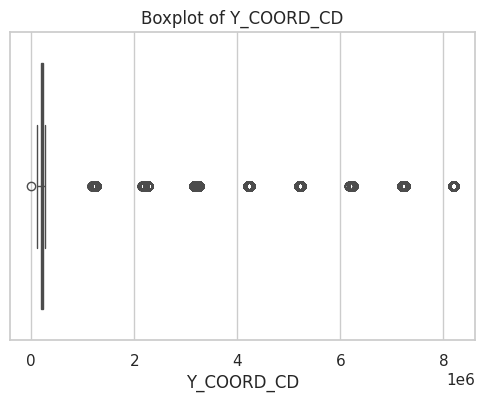

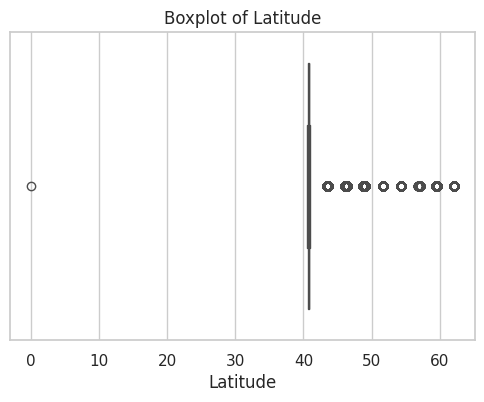

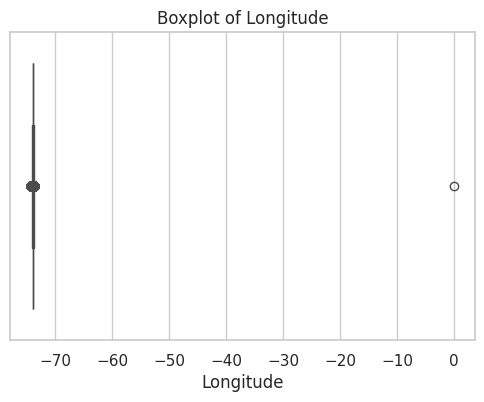

In [ ]:
# Boxplots for detecting outliers in numerical features
for feature in numerical_features:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=data[feature])
    plt.title(f'Boxplot of {feature}')
    plt.show()


# Correlation Analysis of Numerical Features

### Purpose:
This code calculates and visualizes the correlations between numerical features in the dataset to identify relationships and dependencies.

---

### Steps:

1. **Calculate Correlation Matrix**:
   - Used `data[numerical_features].corr()` to compute pairwise Pearson correlation coefficients between numerical features.
   - Selected numerical features include:
     - `PD_CD`, `KY_CD`, `ARREST_PRECINCT`, `X_COORD_CD`, `Y_COORD_CD`, `Latitude`, `Longitude`.

2. **Visualize Correlation Matrix**:
   - Created a heatmap using `sns.heatmap()`:
     - **`annot=True`**: Displays correlation coefficients on the heatmap.
     - **`fmt=".2f"`**: Formats coefficients to two decimal places.
     - **`cmap='coolwarm'`**: Applies a color gradient to indicate strength and direction of correlations.
   - Added a title for context.

---

### Output:
- **Heatmap**:
  - Displays correlation coefficients:
    - Positive values (closer to 1): Strong positive correlation.
    - Negative values (closer to -1): Strong negative correlation.
    - Values near 0: Weak or no correlation.

---

### Outcome:
The heatmap helps identify significant relationships between numerical features, guiding feature selection and engineering for predictive modeling.


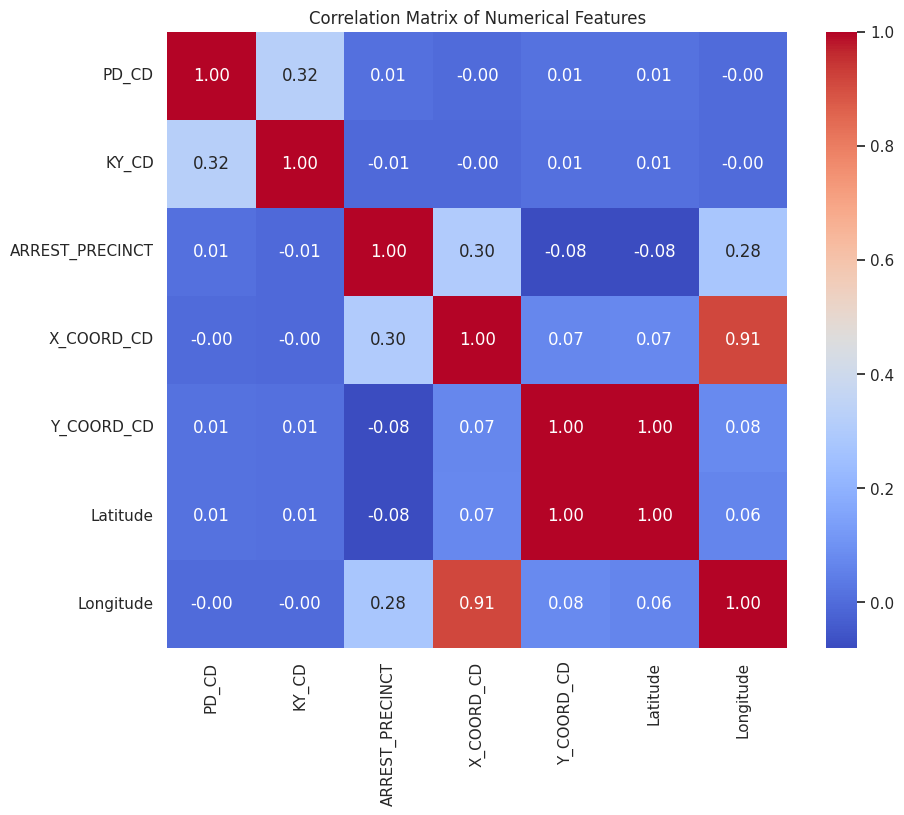

In [ ]:
# Calculate the correlation matrix for numerical features
corr_matrix = data[numerical_features].corr()

# Heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Numerical Features')
plt.show()


# Encoding Categorical Features with LabelEncoder

### Purpose:
This code encodes the categorical features `LAW_CAT_CD` and `ARREST_BORO` into numerical format using `LabelEncoder` for machine learning applications.

---

### Steps:

1. **Initialize LabelEncoder**:
   - Created an instance of `LabelEncoder` to transform categorical data into integer labels.

2. **Encode Features**:
   - **`LAW_CAT_CD`**:
     - Encoded into a new column `LAW_CAT_CD_encoded`.
   - **`ARREST_BORO`**:
     - Encoded into a new column `ARREST_BORO_encoded`.

3. **Verify Results**:
   - Displayed the first few rows of the encoded columns using `head()` to confirm the transformation.

---

### Output:
- **`LAW_CAT_CD_encoded`**: Integer representation of categories in `LAW_CAT_CD`.
- **`ARREST_BORO_encoded`**: Integer representation of boroughs in `ARREST_BORO`.

---

### Outcome:
The dataset now includes encoded numerical columns for `LAW_CAT_CD` and `ARREST_BORO`, making them suitable for use in machine learning models.


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
encoder = LabelEncoder()

# Encode 'LAW_CAT_CD' and 'ARREST_BORO'
data['LAW_CAT_CD_encoded'] = encoder.fit_transform(data['LAW_CAT_CD'])
data['ARREST_BORO_encoded'] = encoder.fit_transform(data['ARREST_BORO'])

# Check the encoded columns
print(data[['LAW_CAT_CD_encoded', 'ARREST_BORO_encoded']].head())


   LAW_CAT_CD_encoded  ARREST_BORO_encoded
0                   2                    1
1                   2                    0
2                   2                    2
3                   4                    2
4                   4                    0


# Encoding the Target Variable `OFNS_DESC` with LabelEncoder

### Purpose:
This code encodes the target variable `OFNS_DESC` (offense descriptions) into numerical format using `LabelEncoder`, preparing it for use in machine learning models.

---

### Steps:

1. **Initialize LabelEncoder**:
   - Created an instance of `LabelEncoder` to transform categorical data into integer labels.

2. **Encode `OFNS_DESC`**:
   - Applied `fit_transform` on the `OFNS_DESC` column to create a new encoded column:
     - **`encoded_OFNS_DESC`**: Contains integer labels representing different offense descriptions.

3. **Verify Results**:
   - Displayed the first few rows of the new column (`encoded_OFNS_DESC`) using `head()` to confirm the transformation.

---

### Output:
- **`encoded_OFNS_DESC`**:
  - Each unique value in `OFNS_DESC` is mapped to a corresponding integer label.
  - The first few values of this encoded column are displayed to ensure correctness.

---

### Outcome:
The dataset now includes an encoded target variable (`encoded_OFNS_DESC`), making it compatible for classification tasks in machine learning.


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
encoder = LabelEncoder()

# Encode 'OFNS_DESC' and create a new column for the encoded target
data['encoded_OFNS_DESC'] = encoder.fit_transform(data['OFNS_DESC'])

# Verify the encoded target variable
print(data['encoded_OFNS_DESC'].head())


0    90
1    80
2    90
3    17
4     8
Name: encoded_OFNS_DESC, dtype: int64


# Preparing Features and Target for Model Training

### Purpose:
This code ensures the feature set and target variable are correctly defined and validates their presence in the dataset.

---

### Steps:

1. **Define Features and Target**:
   - **Features**:
     - Selected columns: `PD_CD`, `KY_CD`, `ARREST_PRECINCT`, `YEAR`, `MONTH`, `DAY`, `WEEKDAY`, `LAW_CAT_CD_encoded`, `ARREST_BORO_encoded`.
   - **Target**:
     - Set as `encoded_OFNS_DESC` (encoded version of the `OFNS_DESC` column).

2. **Validate Features and Target**:
   - Checked the first few rows of the features (`data[features]`) and the target (`data[target]`) to ensure they exist and contain the expected data.

---

### Outputs:
1. **Features**:
   - Displays the first 5 rows of the feature columns:
     - Includes numerical and encoded categorical data.
2. **Target**:
   - Displays the first 5 rows of the target variable (`encoded_OFNS_DESC`).

---

### Outcome:
The feature set and target variable are correctly defined and verified, ensuring readiness for training and evaluation in a machine learning model.


In [ ]:
# Define the features list correctly with available columns
features = ['PD_CD', 'KY_CD', 'ARREST_PRECINCT', 'YEAR', 'MONTH', 'DAY', 'WEEKDAY', 'LAW_CAT_CD_encoded', 'ARREST_BORO_encoded']
target = 'encoded_OFNS_DESC'  # Assuming 'encoded_OFNS_DESC' is created if 'OFNS_DESC' was encoded earlier

# Check if all features are in the dataframe
print(data[features].head())
print(data[target].head())


   PD_CD  KY_CD  ARREST_PRECINCT  YEAR  MONTH  DAY  WEEKDAY  \
0  184.0  341.0               73  2018      8    7        1   
1  397.0  105.0               40  2020     11   13        4   
2  440.0  341.0               23  2019      7    1        0   
3  569.0  235.0               32  2020      2   22        5   
4  101.0  344.0               49  2020     11   10        1   

   LAW_CAT_CD_encoded  ARREST_BORO_encoded  
0                   2                    1  
1                   2                    0  
2                   2                    2  
3                   4                    2  
4                   4                    0  
0    90
1    80
2    90
3    17
4     8
Name: encoded_OFNS_DESC, dtype: int64


# Verifying Feature Set and Target Variable in the Dataset

### Purpose:
This code ensures that the defined feature set and target variable are present in the dataset and contain the expected data.

---

### Steps:

1. **Define Features**:
   - Selected the following columns as features:
     - **`PD_CD`**: Offense Code.
     - **`KY_CD`**: Key Code.
     - **`ARREST_PRECINCT`**: Precinct where the arrest occurred.
     - **`YEAR`**, **`MONTH`**, **`DAY`**, **`WEEKDAY`**: Temporal features extracted from `ARREST_DATE`.
     - **`LAW_CAT_CD_encoded`**: Encoded version of `LAW_CAT_CD`.
     - **`ARREST_BORO_encoded`**: Encoded version of `ARREST_BORO`.

2. **Verify Features**:
   - Checked the first 5 rows of the feature columns using `data[features].head()`.

3. **Verify Target**:
   - Displayed the first 5 rows of the target variable (`encoded_OFNS_DESC`) using `data['encoded_OFNS_DESC'].head()`.

---

### Outputs:
1. **Feature Set**:
   - Prints the first few rows of the selected feature columns.
2. **Target Variable**:
   - Prints the first few rows of `encoded_OFNS_DESC`.

---

### Outcome:
Both the feature set and target variable are verified to exist and contain appropriate data, ensuring the dataset is ready for machine learning tasks.


In [ ]:
# Define the features list correctly with available columns
features = ['PD_CD', 'KY_CD', 'ARREST_PRECINCT', 'YEAR', 'MONTH', 'DAY', 'WEEKDAY', 'LAW_CAT_CD_encoded', 'ARREST_BORO_encoded']

# Check if all features and the target are in the dataframe
print(data[features].head())
print(data['encoded_OFNS_DESC'].head())


   PD_CD  KY_CD  ARREST_PRECINCT  YEAR  MONTH  DAY  WEEKDAY  \
0  184.0  341.0               73  2018      8    7        1   
1  397.0  105.0               40  2020     11   13        4   
2  440.0  341.0               23  2019      7    1        0   
3  569.0  235.0               32  2020      2   22        5   
4  101.0  344.0               49  2020     11   10        1   

   LAW_CAT_CD_encoded  ARREST_BORO_encoded  
0                   2                    1  
1                   2                    0  
2                   2                    2  
3                   4                    2  
4                   4                    0  
0    90
1    80
2    90
3    17
4     8
Name: encoded_OFNS_DESC, dtype: int64


# Extracting Temporal Features from `ARREST_DATE`

### Purpose:
This code ensures the `ARREST_DATE` column is in datetime format and extracts additional temporal features to enhance the dataset for time-based analysis.

---

### Steps:

1. **Convert `ARREST_DATE` to Datetime**:
   - Used `pd.to_datetime()` to ensure `ARREST_DATE` is in the correct `datetime64` format.

2. **Extract Temporal Features**:
   - **`YEAR`**: Extracted using `.dt.year`.
   - **`MONTH`**: Extracted using `.dt.month`.
   - **`DAY`**: Extracted using `.dt.day`.
   - **`WEEKDAY`**: Extracted using `.dt.weekday` (numeric representation where Monday=0, Sunday=6).

---

### Outcome:
The dataset is enriched with four new columns (`YEAR`, `MONTH`, `DAY`, `WEEKDAY`) derived from the `ARREST_DATE`, making it ready for temporal analysis or modeling tasks.

### Next Steps:
- Verify the newly added columns by checking their descriptive statistics or unique values to ensure correctness.


In [ ]:
# Ensure ARREST_DATE is in datetime format for any time-series analysis
data['ARREST_DATE'] = pd.to_datetime(data['ARREST_DATE'])

# Extract year, month, day, and day of the week from 'ARREST_DATE'
data['YEAR'] = data['ARREST_DATE'].dt.year
data['MONTH'] = data['ARREST_DATE'].dt.month
data['DAY'] = data['ARREST_DATE'].dt.day
data['WEEKDAY'] = data['ARREST_DATE'].dt.weekday  # Monday=0, Sunday=6


# Visualizing Monthly Crime Trends Over the Years

### Purpose:
This code visualizes the distribution of crimes across months for different years to analyze seasonal crime patterns in NYC.

---

### Steps:

1. **Set Plot Style**:
   - Used Seaborn's `whitegrid` style for a clean and consistent visualization.

2. **Create Count Plot**:
   - **X-Axis**: Months (`MONTH`) to show seasonal trends.
   - **Hue**: Year (`YEAR`) to distinguish crime counts for different years.
   - **Y-Axis**: Number of arrests, automatically calculated by `sns.countplot`.

3. **Customize Plot**:
   - Set figure size to `(12, 6)` for better readability.
   - Added:
     - **Title**: "Monthly Crime Trends in NYC".
     - **Axis Labels**: 'Month' and 'Number of Arrests'.
     - **Legend**: Displays years as categories.

---

### Output:
- A count plot showing:
  - Crime trends across months (January to December).
  - Yearly variations in crime counts for each month.

---

### Insights:
This plot helps identify:
1. Seasonal peaks and troughs in crime rates.
2. Year-over-year changes in crime patterns for each month.

### Next Steps:
- Analyze the reasons behind significant variations, if any.
- Apply further filtering for specific crime types or boroughs for deeper insights.


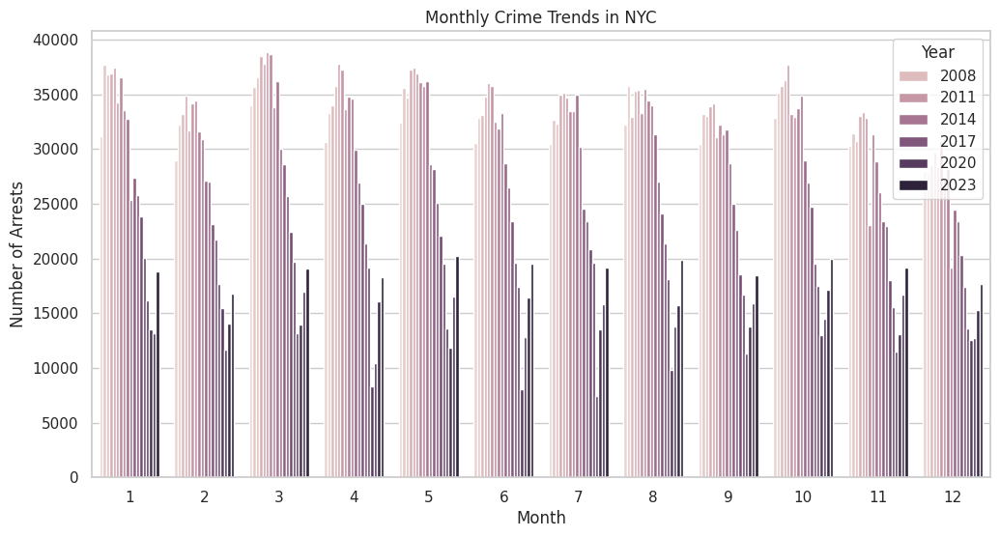

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")

# Plot the total number of crimes per month over the years
plt.figure(figsize=(12, 6))
sns.countplot(x='MONTH', hue='YEAR', data=data)
plt.title('Monthly Crime Trends in NYC')
plt.xlabel('Month')
plt.ylabel('Number of Arrests')
plt.legend(title='Year')
plt.show()


# Categorizing Offenses

### Purpose:
Classify offenses into broader categories for simplified analysis.

### Categories:
1. **Violent Crimes**: Includes `ASSAULT`, `HOMICIDE`, `MANSLAUGHTER`.
2. **Drug Offenses**: Includes `DRUG`, `CONTROLLED SUBSTANCE`.
3. **Theft & Related Offenses**: Includes `THEFT`, `LARCENY`, `ROBBERY`, `BURGLARY`.
4. **Fraud & Financial Crimes**: Includes `FRAUD`, `FORGERY`.
5. **Traffic Offenses**: Includes `TRAFFIC`, `VEHICLE`.
6. **Other Crimes**: Default for offenses not in the above categories.
7. **Unknown**: Handles missing values.

### Outcome:
The function categorizes offenses into a manageable number of groups for better data organization and analysis.


In [ ]:
def categorize_offense(offense):
    if pd.isna(offense):
        return 'Unknown'  # Handling NaN or None values
    offense = str(offense)  # Ensuring the offense is treated as a string
    if 'ASSAULT' in offense or 'HOMICIDE' in offense or 'MANSLAUGHTER' in offense:
        return 'Violent Crimes'
    elif 'DRUG' in offense or 'CONTROLLED SUBSTANCE' in offense:
        return 'Drug Offenses'
    elif 'THEFT' in offense or 'LARCENY' in offense or 'ROBBERY' in offense or 'BURGLARY' in offense:
        return 'Theft & Related Offenses'
    elif 'FRAUD' in offense or 'FORGERY' in offense:
        return 'Fraud & Financial Crimes'
    elif 'TRAFFIC' in offense or 'VEHICLE' in offense:
        return 'Traffic Offenses'
    else:
        return 'Other Crimes'


# Visualizing Crime Categories by Borough

### Purpose:
This code categorizes offenses into broader groups, adds a new column `Crime_Category`, and visualizes the distribution of these categories across NYC boroughs.

---

### Steps:

1. **Create `Crime_Category`**:
   - Applied the `categorize_offense` function to the `OFNS_DESC` column.
   - Created a new column `Crime_Category` containing grouped offense categories.

2. **Visualize Distribution**:
   - **Plot Type**: Used a grouped bar chart (`sns.countplot`) to display the count of arrests by `ARREST_BORO`, grouped by `Crime_Category`.
   - **Customization**:
     - `hue='Crime_Category'`: Color-coded categories.
     - Rotated x-axis labels for better readability.
     - Positioned the legend outside the plot for clarity.

---

### Output:
- **Grouped Bar Chart**:
  - X-Axis: NYC boroughs (`ARREST_BORO`).
  - Y-Axis: Number of arrests.
  - Bars: Crime categories, color-coded using the `viridis` palette.

---

### Insights:
- Highlights the distribution of different crime categories across boroughs.
- Reveals borough-specific crime trends and hotspots for specific offense types.


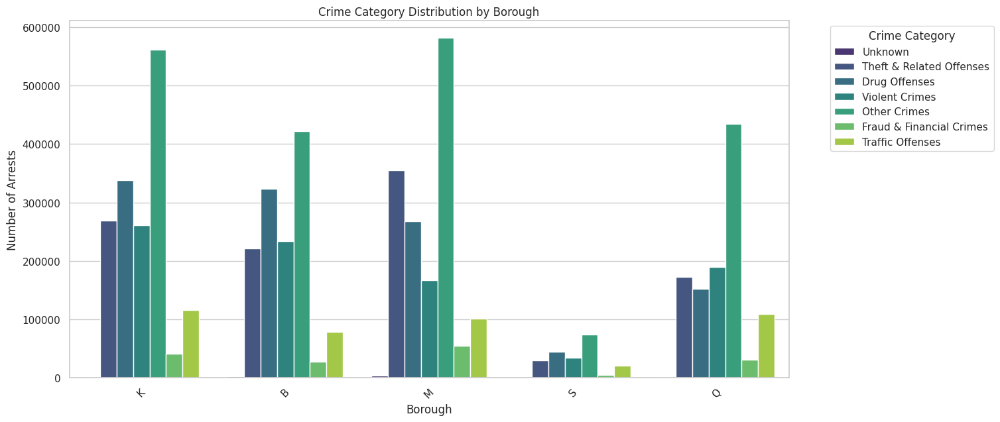

In [ ]:
# Apply the function to create a new column for the grouped offense categories
data['Crime_Category'] = data['OFNS_DESC'].apply(categorize_offense)

# Visualization code
plt.figure(figsize=(14, 7))
sns.countplot(x='ARREST_BORO', hue='Crime_Category', data=data, palette='viridis')
plt.title('Crime Category Distribution by Borough')
plt.xlabel('Borough')
plt.ylabel('Number of Arrests')
plt.legend(title='Crime Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()


# Top 10 Precincts with the Highest Crime Rates

### Purpose:
This code identifies the top 10 precincts with the highest number of arrests and visualizes their crime counts.

---

### Steps:

1. **Identify Top Precincts**:
   - Used `value_counts()` to calculate the total arrests per precinct.
   - Selected the top 10 precincts with the highest crime counts.

2. **Filter Data**:
   - Extracted data for the top 10 precincts using `isin()`.

3. **Visualize Crime Rates**:
   - Created a bar chart using `sns.countplot`:
     - **X-Axis**: Precinct numbers.
     - **Y-Axis**: Number of arrests.
     - **Order**: Ensured bars are ordered by precinct ranking.

---

### Output:
- **Bar Chart**:
  - Displays the number of arrests for each of the top 10 precincts.

---

### Insights:
- Highlights the precincts with the highest crime activity.
- Useful for targeted resource allocation and hotspot analysis.


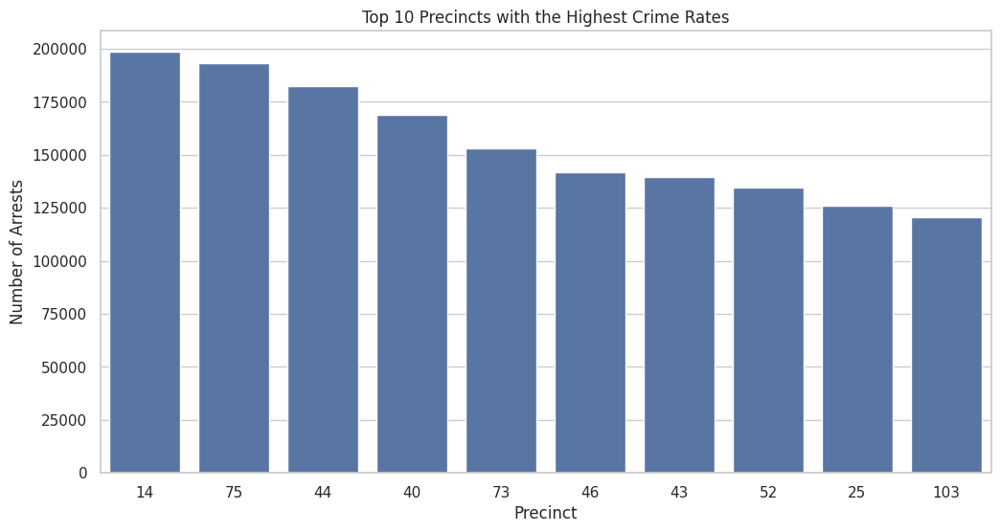

In [ ]:
# Top 10 precincts with the highest number of crimes
top_precincts = data['ARREST_PRECINCT'].value_counts().head(10).index

# Filter data for top precincts
top_precinct_data = data[data['ARREST_PRECINCT'].isin(top_precincts)]

# Plot
plt.figure(figsize=(12, 6))
sns.countplot(x='ARREST_PRECINCT', data=top_precinct_data, order=top_precincts)
plt.title('Top 10 Precincts with the Highest Crime Rates')
plt.xlabel('Precinct')
plt.ylabel('Number of Arrests')
plt.show()


# Seasonal Variation in Crime Rates

### Purpose:
This code analyzes and visualizes how crime rates vary across seasons.

---

### Steps:

1. **Define Seasons**:
   - Mapped each month to its corresponding season:
     - **Winter**: December, January, February.
     - **Spring**: March, April, May.
     - **Summer**: June, July, August.
     - **Fall**: September, October, November.

2. **Create `SEASON` Column**:
   - Used the `map()` function to assign seasons based on the `MONTH` column.

3. **Visualize Seasonal Trends**:
   - Created a bar chart using `sns.countplot`:
     - **X-Axis**: Seasons (`Winter`, `Spring`, `Summer`, `Fall`).
     - **Y-Axis**: Number of arrests.
     - Used `order` to ensure a logical sequence of seasons.

---

### Output:
- **Bar Chart**:
  - Displays the number of arrests for each season, highlighting seasonal crime trends.

---

### Insights:
- Reveals patterns in crime rates across seasons.
- Helps understand the influence of weather or seasonal factors on criminal activity.


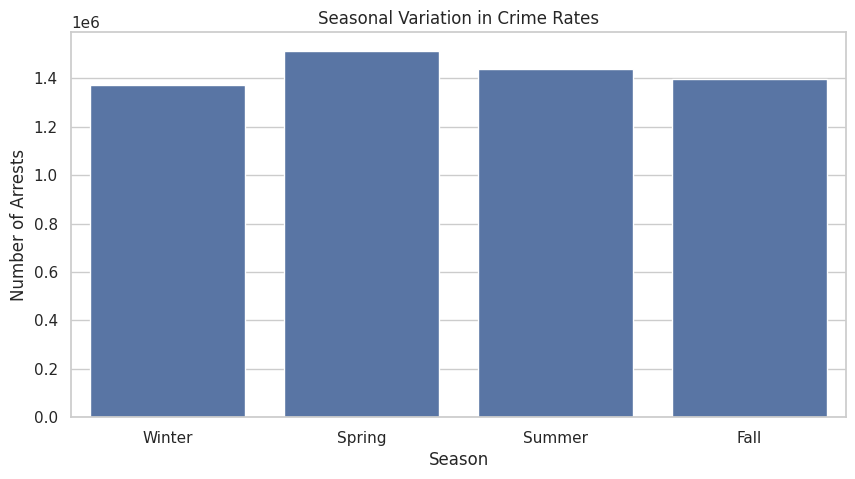

In [ ]:
# Define seasons
seasons = {1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring', 5: 'Spring', 6: 'Summer',
           7: 'Summer', 8: 'Summer', 9: 'Fall', 10: 'Fall', 11: 'Fall', 12: 'Winter'}

data['SEASON'] = data['MONTH'].map(seasons)

# Plot seasonal variations
plt.figure(figsize=(10, 5))
sns.countplot(x='SEASON', data=data, order=['Winter', 'Spring', 'Summer', 'Fall'])
plt.title('Seasonal Variation in Crime Rates')
plt.xlabel('Season')
plt.ylabel('Number of Arrests')
plt.show()


## Law Enforcement Strategies: Examine the effectiveness of law enforcement strategies and policies based on arrest data.

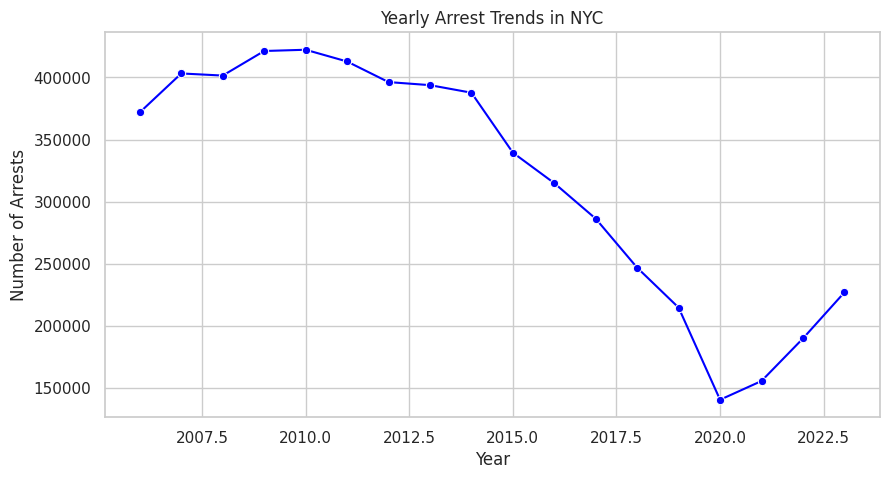

In [ ]:
# Extract year from 'ARREST_DATE' to group by year
data['YEAR'] = data['ARREST_DATE'].dt.year

# Group by year and count the number of arrests each year
yearly_arrests = data['YEAR'].value_counts().sort_index()

# Plot the yearly trends
plt.figure(figsize=(10, 5))
sns.lineplot(x=yearly_arrests.index, y=yearly_arrests.values, marker='o', linestyle='-', color='blue')
plt.title('Yearly Arrest Trends in NYC')
plt.xlabel('Year')
plt.ylabel('Number of Arrests')
plt.grid(True)
plt.show()


# Monthly Arrest Trends Over Different Years

### Purpose:
This code analyzes and visualizes monthly arrest trends over multiple years using a heatmap.

---

### Steps:

1. **Extract `MONTH`**:
   - Extracted the month from `ARREST_DATE` for grouping purposes.

2. **Group and Aggregate Data**:
   - Grouped arrests by `YEAR` and `MONTH` using `.groupby()`.
   - Calculated the total arrests for each month and year combination.

3. **Pivot Data**:
   - Transformed the data into a pivot table using `.pivot()`:
     - **Index**: Months (`MONTH`).
     - **Columns**: Years (`YEAR`).
     - **Values**: Arrest counts.

4. **Visualize with Heatmap**:
   - Created a heatmap using `sns.heatmap`:
     - **Rows**: Months.
     - **Columns**: Years.
     - **Color Scale**: Arrest counts (yellow to green-blue gradient).

---

### Output:
- **Heatmap**:
  - Visualizes the intensity of arrests by month and year.
  - Darker shades indicate higher arrest counts.

---

### Insights:
- Highlights seasonal patterns and year-over-year variations in arrests.
- Identifies months with consistently high or low crime activity.


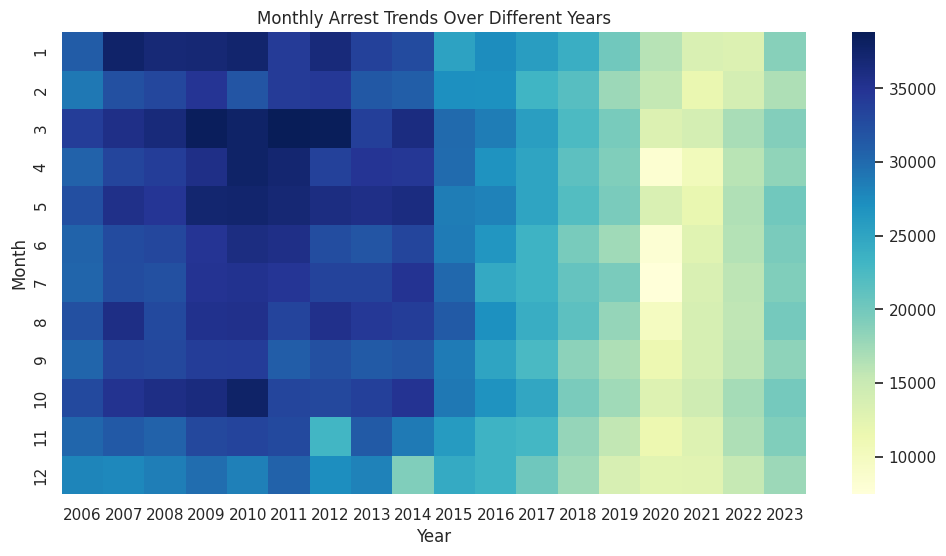

In [ ]:
# Extract month from 'ARREST_DATE'
data['MONTH'] = data['ARREST_DATE'].dt.month

# Group by year and month to analyze monthly trends
monthly_arrests = data.groupby(['YEAR', 'MONTH']).size().reset_index(name='Arrest_Counts')

# Pivot the data for easier visualization
monthly_pivot = monthly_arrests.pivot(index='MONTH', columns='YEAR', values='Arrest_Counts')

# Plotting monthly trends across years
plt.figure(figsize=(12, 6))
sns.heatmap(monthly_pivot, annot=False, cmap='YlGnBu', fmt='.0f')
plt.title('Monthly Arrest Trends Over Different Years')
plt.xlabel('Year')
plt.ylabel('Month')
plt.show()


# Yearly Arrest Trends by Borough

### Purpose:
This code analyzes and visualizes yearly arrest trends across NYC boroughs to identify patterns and variations over time.

---

### Steps:

1. **Group Data**:
   - Grouped arrests by `ARREST_BORO` (borough) and `YEAR` using `.groupby()`.
   - Aggregated the total arrests for each borough-year combination.

2. **Create Line Plot**:
   - Used `sns.lineplot` to visualize trends:
     - **X-Axis**: Year (`YEAR`).
     - **Y-Axis**: Total number of arrests (`Arrest_Counts`).
     - **Hue**: Borough (`ARREST_BORO`) to differentiate trends across boroughs.
     - Added markers for data points to enhance clarity.

3. **Customize Plot**:
   - Enlarged the figure size for readability.
   - Added:
     - **Title**: "Yearly Arrest Trends by Borough".
     - **Axis Labels**: `Year` and `Number of Arrests`.
     - **Legend**: Positioned outside the plot for better visibility.
   - Enabled grid lines for better trend interpretation.

---

### Output:
- **Line Plot**:
  - Displays yearly arrest trends for each borough.
  - Highlights differences in crime rates and trends over time.

---

### Insights:
- Identifies boroughs with increasing, decreasing, or stable arrest trends.
- Highlights significant year-over-year variations for specific boroughs.


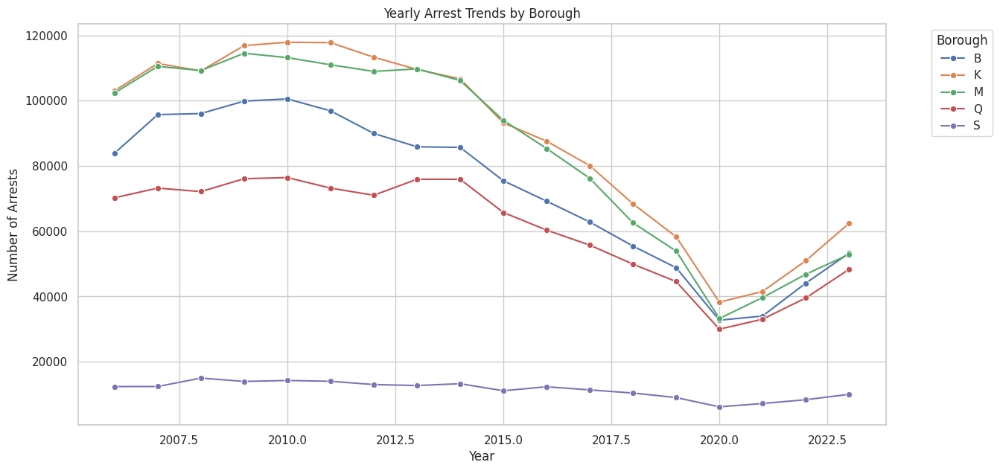

In [ ]:
# Group by 'ARREST_BORO' and 'YEAR' to analyze trends
borough_yearly_arrests = data.groupby(['ARREST_BORO', 'YEAR']).size().reset_index(name='Arrest_Counts')

# Plotting borough-wise trends
plt.figure(figsize=(14, 7))
sns.lineplot(x='YEAR', y='Arrest_Counts', hue='ARREST_BORO', data=borough_yearly_arrests, marker='o')
plt.title('Yearly Arrest Trends by Borough')
plt.xlabel('Year')
plt.ylabel('Number of Arrests')
plt.legend(title='Borough', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


# Yearly Arrest Trends for Top Crime Categories

### Purpose:
This code visualizes the yearly trends for the top 5 most common crime categories to highlight their evolution over time.

---

### Steps:

1. **Group Data**:
   - Grouped arrests by `OFNS_DESC` (crime type) and `YEAR` using `.groupby()`.
   - Calculated the total arrests for each crime type and year.

2. **Filter Top Crime Categories**:
   - Identified the top 5 most common crime categories using `.value_counts()` on `OFNS_DESC`.
   - Filtered the data to include only these top 5 categories.

3. **Create Line Plot**:
   - Used `sns.lineplot` to visualize trends:
     - **X-Axis**: Year (`YEAR`).
     - **Y-Axis**: Total number of arrests (`Arrest_Counts`).
     - **Hue**: Crime category (`OFNS_DESC`) to differentiate trends.
     - Added markers to emphasize data points.

4. **Customize Plot**:
   - Enlarged the figure for better readability.
   - Added:
     - **Title**: "Yearly Arrest Trends for Top Crime Categories".
     - **Axis Labels**: `Year` and `Number of Arrests`.
     - **Legend**: Positioned outside the plot for clarity.
   - Enabled grid lines for improved trend interpretation.

---

### Output:
- **Line Plot**:
  - Displays yearly arrest trends for the top 5 crime categories.
  - Highlights the rise or decline of specific crimes over the years.

---

### Insights:
- Identifies crime categories with increasing or decreasing trends.
- Highlights years with significant shifts in arrest counts for specific crimes.


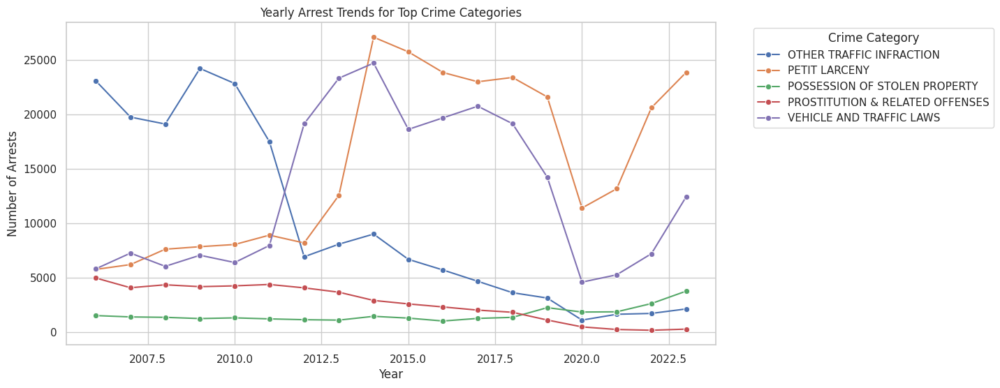

In [ ]:
# Group data by 'OFNS_DESC' and 'YEAR' to analyze the trend of crime categories
crime_yearly_trends = data.groupby(['OFNS_DESC', 'YEAR']).size().reset_index(name='Arrest_Counts')

# Filter for the top 5 most common crime types
top_5_crimes = crime_yearly_trends['OFNS_DESC'].value_counts().head(5).index
filtered_data = crime_yearly_trends[crime_yearly_trends['OFNS_DESC'].isin(top_5_crimes)]

# Plotting the trend of top crime categories over the years
plt.figure(figsize=(12, 6))
sns.lineplot(x='YEAR', y='Arrest_Counts', hue='OFNS_DESC', data=filtered_data, marker='o')
plt.title('Yearly Arrest Trends for Top Crime Categories')
plt.xlabel('Year')
plt.ylabel('Number of Arrests')
plt.legend(title='Crime Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


# Number of Arrests by Borough

### Purpose:
This code visualizes the total number of arrests in each NYC borough to understand geographical crime distribution.

---

### Steps:

1. **Set Plot Style**:
   - Applied Seaborn's `whitegrid` style for clean and consistent visualization.

2. **Create Count Plot**:
   - Used `sns.countplot` to display the total arrests for each borough (`ARREST_BORO`).
   - Ordered the bars by arrest count using `.value_counts().index`.

3. **Customize Plot**:
   - Enlarged the figure to `(10, 6)` for better readability.
   - Added:
     - **Title**: "Number of Arrests by Borough".
     - **Axis Labels**: `Borough` and `Number of Arrests`.
   - Applied the `Set2` color palette for aesthetic distinction.

---

### Output:
- **Bar Chart**:
  - X-Axis: Boroughs, sorted by arrest counts.
  - Y-Axis: Number of arrests.

---

### Insights:
- Highlights boroughs with the highest and lowest arrest counts.
- Provides a clear geographical view of crime activity in NYC.


<ipython-input-39-3d60b62795d6>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='ARREST_BORO', data=data, palette='Set2', order=data['ARREST_BORO'].value_counts().index)


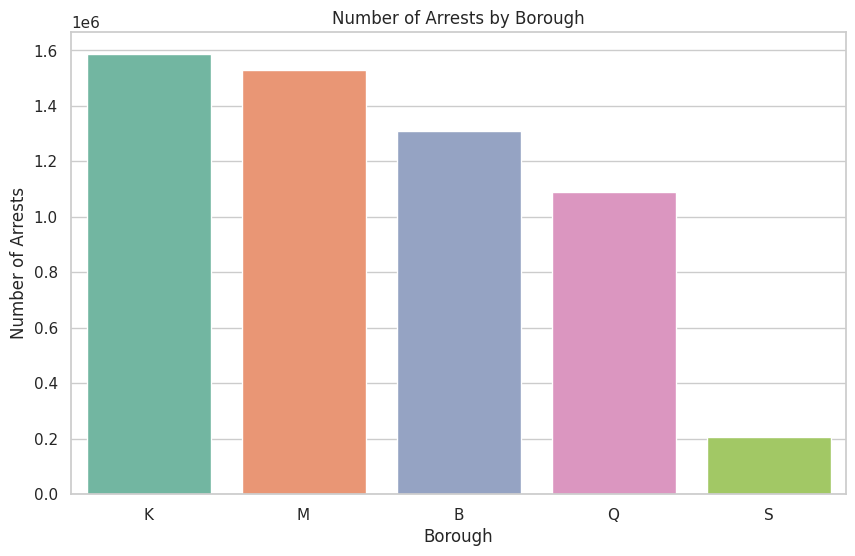

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style of the plots
sns.set(style="whitegrid")

# Count plot of arrests by borough
plt.figure(figsize=(10, 6))
sns.countplot(x='ARREST_BORO', data=data, palette='Set2', order=data['ARREST_BORO'].value_counts().index)
plt.title('Number of Arrests by Borough')
plt.xlabel('Borough')
plt.ylabel('Number of Arrests')
plt.show()


# Yearly Arrest Trends by Borough

### Purpose:
This code visualizes how arrest trends have evolved over the years in each NYC borough, helping identify temporal and geographical patterns.

---

### Steps:

1. **Group Data**:
   - Grouped the data by `YEAR` and `ARREST_BORO` using `.groupby()`.
   - Calculated the total number of arrests for each borough in each year.

2. **Create Line Plot**:
   - Used `sns.lineplot` to visualize trends:
     - **X-Axis**: Years (`YEAR`).
     - **Y-Axis**: Number of arrests (`Counts`).
     - **Hue**: Boroughs (`ARREST_BORO`) for differentiated trends.
     - Added markers to highlight data points.

3. **Customize Plot**:
   - Enlarged the figure size for better readability.
   - Added:
     - **Title**: "Yearly Arrest Trends by Borough".
     - **Axis Labels**: `Year` and `Number of Arrests`.
     - **Legend**: Placed outside the plot for clarity.
   - Enabled grid lines for easier trend analysis.

---

### Output:
- **Line Plot**:
  - Displays yearly arrest trends for each borough.
  - Each line represents a borough's arrest trend over the years.

---

### Insights:
- Highlights boroughs with increasing, decreasing, or stable arrest trends.
- Shows how crime activity varies over time in different areas.


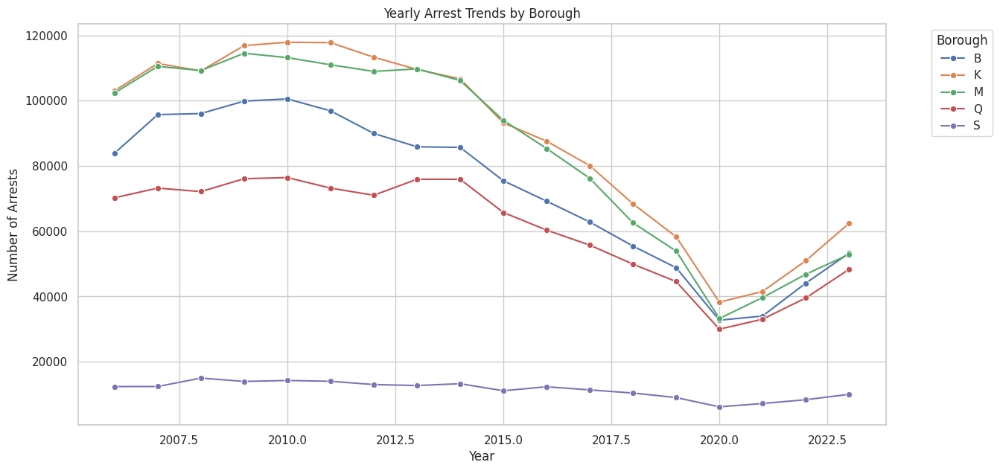

In [ ]:
# Group by year and borough to see yearly arrest trends in each borough
yearly_borough_arrests = data.groupby(['YEAR', 'ARREST_BORO']).size().reset_index(name='Counts')

# Plotting the trend of arrests in each borough over the years
plt.figure(figsize=(14, 7))
sns.lineplot(x='YEAR', y='Counts', hue='ARREST_BORO', data=yearly_borough_arrests, marker='o')
plt.title('Yearly Arrest Trends by Borough')
plt.xlabel('Year')
plt.ylabel('Number of Arrests')
plt.legend(title='Borough', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


## Demographic Studies: Analyze the relationship between demographic factors (such as age, sex, and race of perpetrators) and arrest rates.

In [ ]:
data = data[data['PERP_SEX'] != 'U']

<ipython-input-42-164116214d92>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='PERP_SEX', data=data, palette='viridis')


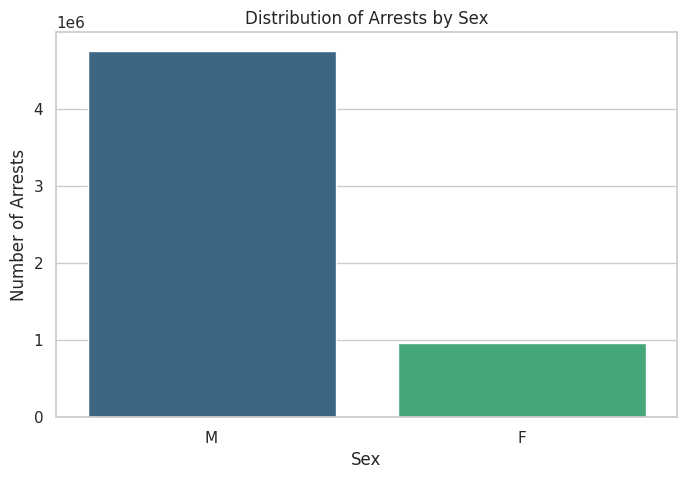

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style of the plots
sns.set(style="whitegrid")

# Count plot of arrests by sex
plt.figure(figsize=(8, 5))
sns.countplot(x='PERP_SEX', data=data, palette='viridis')
plt.title('Distribution of Arrests by Sex')
plt.xlabel('Sex')
plt.ylabel('Number of Arrests')
plt.show()


# Distribution of Arrests by Race

### Purpose:
This code visualizes the total number of arrests categorized by the race of the individuals arrested.

---

### Steps:

1. **Set Plot Style**:
   - Used Seaborn's `countplot` to create a bar chart showing the distribution of arrests by `PERP_RACE`.

2. **Customize Plot**:
   - Enlarged the figure to `(12, 6)` for readability.
   - Applied the `magma` color palette for a visually appealing gradient.
   - Ordered the bars by arrest counts using `.value_counts().index`.
   - Rotated x-axis labels for better readability.

3. **Add Labels and Title**:
   - **Title**: "Distribution of Arrests by Race".
   - **X-Axis**: `Race`.
   - **Y-Axis**: `Number of Arrests`.

---

### Output:
- **Bar Chart**:
  - X-Axis: Race categories, sorted by arrest counts.
  - Y-Axis: Number of arrests for each race.

---

### Insights:
- Highlights racial demographics in arrest statistics.
- Identifies the most and least represented groups in arrests.


<ipython-input-43-272c7d94b98a>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='PERP_RACE', data=data, palette='magma', order=data['PERP_RACE'].value_counts().index)


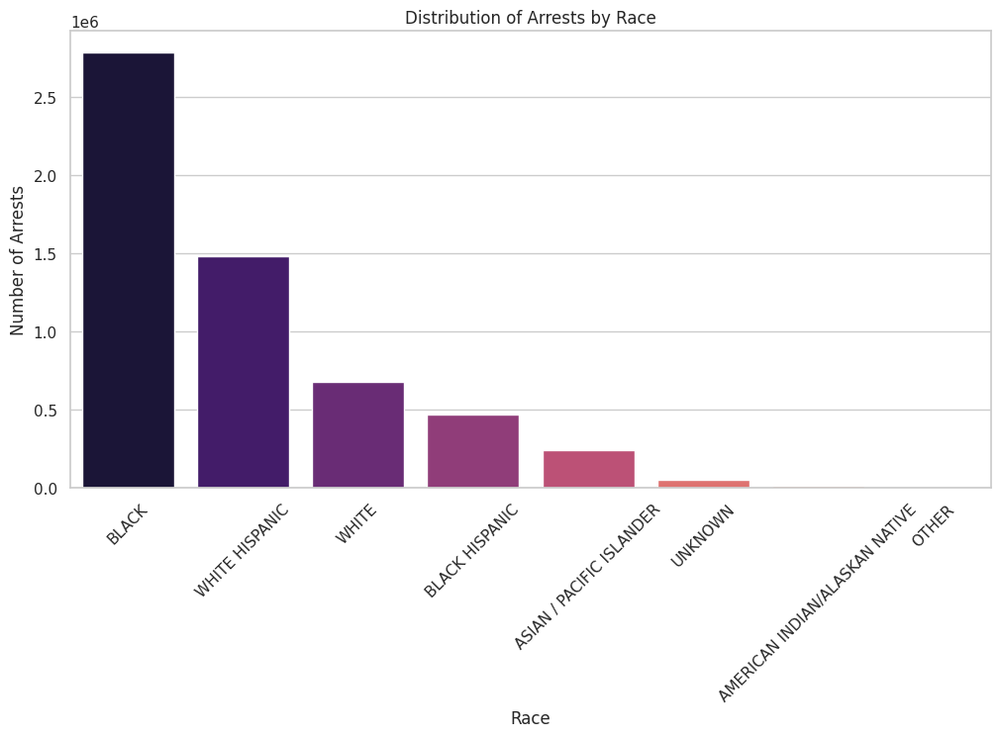

In [ ]:
# Count plot of arrests by race
plt.figure(figsize=(12, 6))
sns.countplot(x='PERP_RACE', data=data, palette='magma', order=data['PERP_RACE'].value_counts().index)
plt.title('Distribution of Arrests by Race')
plt.xlabel('Race')
plt.ylabel('Number of Arrests')
plt.xticks(rotation=45)
plt.show()


# Distribution of Arrests by Race and Sex

### Purpose:
This code visualizes the number of arrests categorized by race and further grouped by sex, providing a detailed demographic breakdown.

---

### Steps:

1. **Set Plot Style**:
   - Used Seaborn's `countplot` to create a grouped bar chart showing the distribution of arrests by `PERP_RACE` and `PERP_SEX`.

2. **Customize Plot**:
   - Enlarged the figure to `(14, 7)` for readability.
   - Applied the `Set2` color palette for distinct and visually appealing groups.
   - Ordered the bars by arrest counts using `.value_counts().index`.
   - Rotated x-axis labels for better readability.

3. **Add Labels and Title**:
   - **Title**: "Distribution of Arrests by Race and Sex".
   - **X-Axis**: `Race`.
   - **Y-Axis**: `Number of Arrests`.
   - Added a legend to represent sex categories.

---

### Output:
- **Grouped Bar Chart**:
  - X-Axis: Race categories, sorted by arrest counts.
  - Y-Axis: Number of arrests.
  - Bars: Grouped by sex (`PERP_SEX`).

---

### Insights:
- Provides a combined view of racial and gender demographics in arrest statistics.
- Highlights disparities or patterns in arrests based on race and sex.


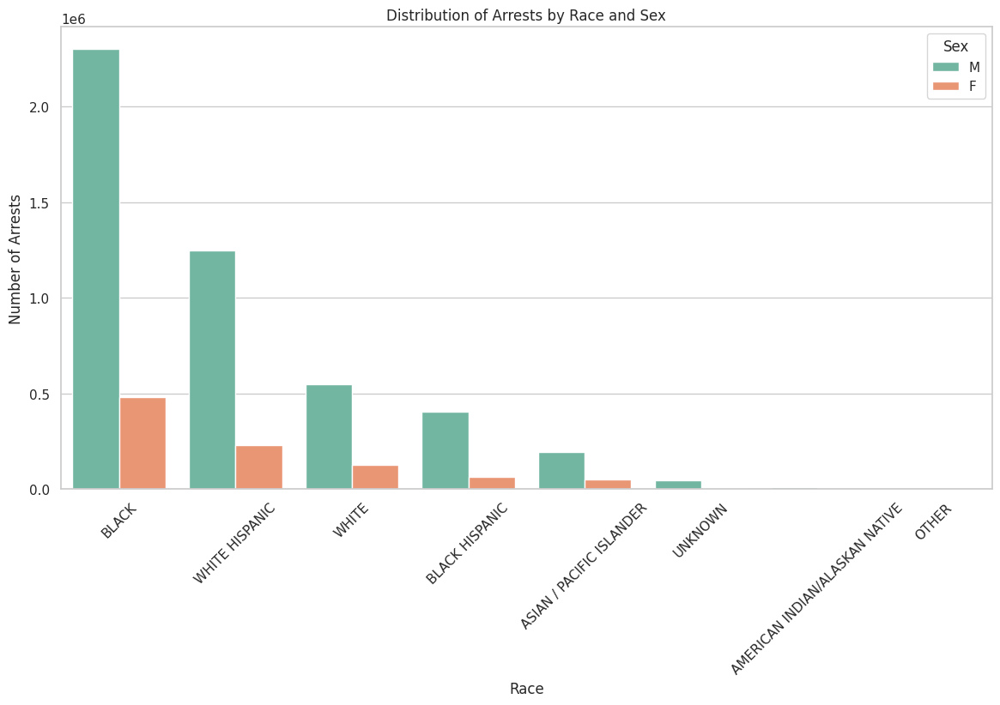

In [ ]:
# Count plot of arrests by sex and race
plt.figure(figsize=(14, 7))
sns.countplot(x='PERP_RACE', hue='PERP_SEX', data=data, palette='Set2', order=data['PERP_RACE'].value_counts().index)
plt.title('Distribution of Arrests by Race and Sex')
plt.xlabel('Race')
plt.ylabel('Number of Arrests')
plt.xticks(rotation=45)
plt.legend(title='Sex')
plt.show()


# Yearly Arrest Trends by Sex

### Purpose:
This code analyzes and visualizes yearly arrest trends based on the sex of the individuals arrested.

---

### Steps:

1. **Group Data**:
   - Grouped arrests by `YEAR` and `PERP_SEX` using `.groupby()`.
   - Calculated the total arrests for each sex category in each year.

2. **Create Line Plot**:
   - Used `sns.lineplot` to visualize trends:
     - **X-Axis**: Year (`YEAR`).
     - **Y-Axis**: Number of arrests (`Counts`).
     - **Hue**: Sex of perpetrators (`PERP_SEX`) for trend comparison.
     - Added markers for data points to emphasize yearly data.

3. **Customize Plot**:
   - Enlarged the figure for clarity.
   - Applied the `viridis` color palette for aesthetic distinction.
   - Added:
     - **Title**: "Yearly Arrest Trends by Sex".
     - **Axis Labels**: `Year` and `Number of Arrests`.
   - Enabled grid lines for better visualization of trends.

---

### Output:
- **Line Plot**:
  - Displays yearly arrest trends for different sex categories (`PERP_SEX`).
  - Shows variation in arrests over time.

---

### Insights:
- Highlights differences in arrest trends between male and female perpetrators.
- Reveals changes in sex demographics of arrests over the years.


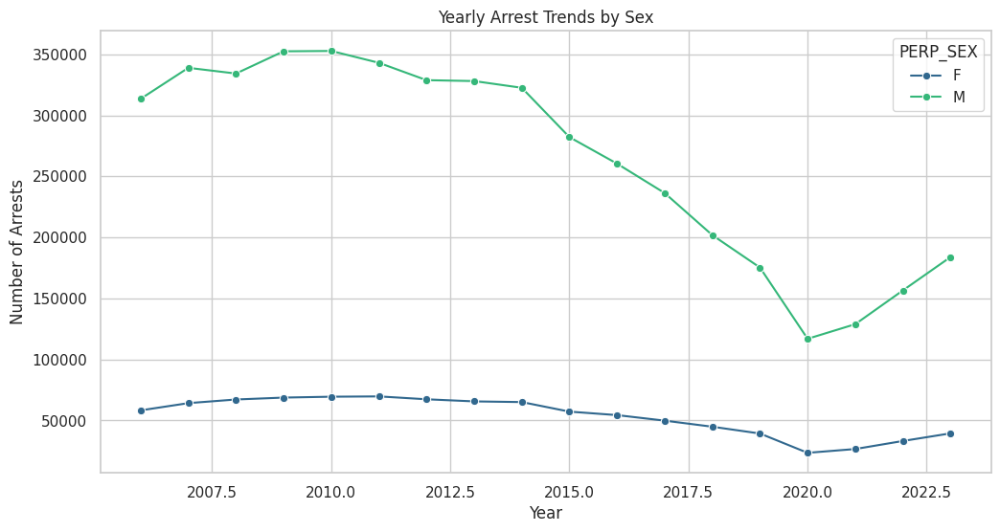

In [ ]:
# Group arrests by year and sex of perpetrators
yearly_sex_arrests = data.groupby(['YEAR', 'PERP_SEX']).size().reset_index(name='Counts')

# Plotting the trend of arrests by sex over the years
plt.figure(figsize=(12, 6))
sns.lineplot(x='YEAR', y='Counts', hue='PERP_SEX', data=yearly_sex_arrests, marker='o', palette='viridis')
plt.title('Yearly Arrest Trends by Sex')
plt.xlabel('Year')
plt.ylabel('Number of Arrests')
plt.grid(True)
plt.show()


## Geospatial Analysis: Utilize the geographic coordinates to map crime incidents and identify hotspots within the city.

In [ ]:
!pip install folium


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.1/85.1 kB 6.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# Assuming 'data' is the DataFrame already loaded with crime data
# Load the dataset (if not loaded)
# file_path = '/mnt/data/NYPD_Arrest_Data__Year_to_Date_.csv'
# data = pd.read_csv(file_path)


In [ ]:
# Filter data to ensure valid geographic coordinates (latitude and longitude are not null or zero)
geo_data = data.dropna(subset=['Latitude', 'Longitude'])
geo_data = geo_data[(geo_data['Latitude'] != 0) & (geo_data['Longitude'] != 0)]
geo_data = geo_data[(geo_data['ARREST_DATE'] >= '2018-01-01') & (geo_data['ARREST_DATE'] <= '2023-12-31')]

# Preview the filtered data
print(geo_data[['Latitude', 'Longitude']].head())


    Latitude  Longitude
0  40.671110 -73.915881
1  40.810398 -73.924895
2  40.789348 -73.947352
3  40.829163 -73.937272
4  40.854826 -73.854880


In [ ]:
# Create a base map centered around New York City
nyc_map1 = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

# Display the map
nyc_map1


In [ ]:
# Create a base map centered around New York City
nyc_map2 = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

# Display the map
nyc_map2


In [ ]:
geo_data_sample = geo_data.sample(n=10000, random_state=42)
# Plot individual crime incidents as circle markers on the map
for idx, row in geo_data_sample.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.5
    ).add_to(nyc_map1)

# Display the map with crime incidents
nyc_map1


# Yearly Arrest Trends by Sex

### Purpose:
This code analyzes and visualizes yearly arrest trends based on the sex of the individuals arrested.

---

### Steps:

1. **Group Data**:
   - Grouped arrests by `YEAR` and `PERP_SEX` using `.groupby()`.
   - Calculated the total arrests for each sex category in each year.

2. **Create Line Plot**:
   - Used `sns.lineplot` to visualize trends:
     - **X-Axis**: Year (`YEAR`).
     - **Y-Axis**: Number of arrests (`Counts`).
     - **Hue**: Sex of perpetrators (`PERP_SEX`) for trend comparison.
     - Added markers for data points to emphasize yearly data.

3. **Customize Plot**:
   - Enlarged the figure for clarity.
   - Applied the `viridis` color palette for aesthetic distinction.
   - Added:
     - **Title**: "Yearly Arrest Trends by Sex".
     - **Axis Labels**: `Year` and `Number of Arrests`.
   - Enabled grid lines for better visualization of trends.

---

### Output:
- **Line Plot**:
  - Displays yearly arrest trends for different sex categories (`PERP_SEX`).
  - Shows variation in arrests over time.

---

### Insights:
- Highlights differences in arrest trends between male and female perpetrators.
- Reveals changes in sex demographics of arrests over the years.


In [ ]:
# Prepare data for heatmap (latitude, longitude)
geo_data_sample = geo_data.sample(n=100000, random_state=42)
heat_data = geo_data_sample[['Latitude', 'Longitude']].values

# Add heatmap to the NYC map
HeatMap(heat_data, radius=10, blur=15, max_zoom=12).add_to(nyc_map2)

# Display the heatmap
nyc_map2
